In [1]:
import os

In [ ]:
# General Training Configuration
EPOCHS = 400
BATCH_SIZE = 8
# BUFFER_SIZE = 100
# TRAIN_TEST_RATIO = 0.8
# Define split ratios
TEST_RATIO = 0.1  # 10% for test
VAL_RATIO = 0.2   # 20% for validation (out of remaining 90%)
TRAIN_ITERATIONS = 10000  # Total training iterations

# Loss Function Weights
LAMBDA_A = 0.5    # Adversarial loss weight
LAMBDA_P = 1.0    # Pixel loss weight
LAMBDA_F = 1.0    # Feature loss weight (VGG16-based)
LAMBDA_S = 0.0001 # Smooth loss weight

# PSNR_MIN = 5
# PSNR_MAX = 50
# SSIM_MIN = 0
# SSIM_MAX = 1

ALPHA = 0.5
BETA = 0.5

# # Generator Configuration
# GEN_FIRST_CONV_KERNEL = 9  # Kernel size for the first conv & deconv layer
# GEN_CONV_KERNEL = 3        # Kernel size for all other convolutional layers
# GEN_CONV_STRIDE = 1        # Stride for all convolutional layers
# GEN_FEATURES = 32          # Feature maps in generator (K)

# # Discriminator Configuration
# DISC_FIRST_LAYERS_KERNEL = 4  # Kernel size for first three conv layers
# DISC_LAST_LAYERS_KERNEL = 4   # Kernel size for last two conv layers
# DISC_FIRST_LAYERS_STRIDE = 2  # Stride for first three layers
# DISC_LAST_LAYERS_STRIDE = 1   # Stride for last two layers
# DISC_FEATURES = 48            # Feature maps in discriminator (K2)
# DISC_PADDING = 1              # Zero-padding for all layers

# Optimizer Configuration
LEARNING_RATE = 2e-4  # Learning rate for both Generator and Discriminator
BETA_1 = 0.5          # Adam optimizer beta1 parameter



In [3]:
# Importing Libraries
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, BatchNormalization, Concatenate, Input, ReLU, Flatten, Dense, Dropout, Add, LayerNormalization, ZeroPadding2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array, load_img, array_to_img, ImageDataGenerator
from skimage.metrics import peak_signal_noise_ratio as psnr, mean_squared_error as mse
import numpy as np
import matplotlib.pyplot as plt
import os

from tensorflow.keras.applications import VGG16
from tensorflow.keras.losses import MeanSquaredError

2025-03-02 10:50:16.361986: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-02 10:50:16.379812: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740891916.393097    4378 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740891916.396718    4378 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-02 10:50:16.415382: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [4]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [5]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

In [6]:
# Paths to noisy and clean image directories
noise_categories = {
    "Gaussian Noise": "/mnt/d/GAN based image denoiser- MAJOR PROJECT/Mod_Final_data/Normalized_image/Gaussian",
    "Speckle Noise": "/mnt/d/GAN based image denoiser- MAJOR PROJECT/Mod_Final_data/Normalized_image/Speckle",
    "Salt and Pepper Noise": "/mnt/d/GAN based image denoiser- MAJOR PROJECT/Mod_Final_data/Normalized_image/Salt_pepper",
    # "Poisson Noise": "/kaggle/input/5000-datasets/Mod_Final_data/Normalized_image/Poisson",
}
clean_image_path = "/mnt/d/GAN based image denoiser- MAJOR PROJECT/Mod_Final_data/Clean_image"

In [7]:
def augment_image(image):
    """
    Applies a set of augmentations to an image tensor (excluding Gaussian blur).
    """
    # Convert NumPy array to Tensor
    image = tf.convert_to_tensor(image, dtype=tf.float32)

    # Random rotation (±10 degrees)
    image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))

    # Random flipping
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)

    # Random brightness & contrast
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

    # Convert Tensor back to NumPy array
    return image.numpy()

# Function to load and preprocess images for training
def load_images(noise_categories, clean_image_path, limit=1500, augment=True):
    """
    Loads noisy and corresponding clean images from specified directories and applies augmentation.

    Parameters:
    - noise_categories (dict): Dictionary mapping noise category names to their respective image directory paths.
    - clean_image_path (str): Path to the directory containing clean images.
    - limit (int, optional): Maximum number of images to load per category. If None, loads all images.
    - augment (bool, optional): Whether to apply data augmentation.

    Returns:
    - X (numpy array): Array of noisy images, normalized to [0,1] range.
    - y (numpy array): Array of corresponding clean images, normalized to [0,1] range.
    """
    
    X, y = [], []  # Lists to store noisy and clean images

    # Iterate through each noise category and its corresponding image directory
    for category, path in noise_categories.items():
        print(f"Processing category: {category}")

        # List all images in the noise category directory (apply limit if provided)
        noise_images = os.listdir(path)[:limit] if limit else os.listdir(path)

        for noise_image in noise_images:
            try:
                # Construct the full file path for the noisy image
                noise_img_path = os.path.join(path, noise_image)

                # Load the noisy image, resize to (256,256), convert to array, and normalize
                noise_img = img_to_array(load_img(noise_img_path, target_size=(256, 256))) / 255.0

                # Construct the corresponding clean image filename
                # Assumes noisy image names contain their category (e.g., "rainy_1.jpg" -> "clear_1.jpg")
                clean_img_name = noise_image.replace(category.lower().replace(" ", "_"), "clear")
                clean_img_path = os.path.join(clean_image_path, clean_img_name)

                # Load the clean image, resize to (256,256), convert to array, and normalize
                clean_img = img_to_array(load_img(clean_img_path, target_size=(256, 256))) / 255.0

                # Apply augmentation if enabled
                if augment:
                    noise_img = augment_image(noise_img)
                    clean_img = augment_image(clean_img)

                X.append(noise_img)  # Append noisy image to input list
                y.append(clean_img)  # Append clean image to target list
            
            except Exception as e:
                print(f"Error processing {noise_image} in {category}: {e}")

    # Convert lists to NumPy arrays for model training
    return np.array(X), np.array(y)




In [8]:
from sklearn.model_selection import train_test_split

# Load noisy and clean images from the specified directories with augmentation
X, y = load_images(noise_categories, clean_image_path, augment=False)



# First, split off the test set from the entire dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_RATIO, random_state=42)

# Now, split the remaining data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=VAL_RATIO / (1 - TEST_RATIO), random_state=42)

# Print the shapes of the resulting sets
print(f"Training set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")
print(f"Test set: {X_test.shape}, {y_test.shape}")


Processing category: Gaussian Noise
Processing category: Speckle Noise
Processing category: Salt and Pepper Noise
Training set: (3149, 256, 256, 3), (3149, 256, 256, 3)
Validation set: (901, 256, 256, 3), (901, 256, 256, 3)
Test set: (450, 256, 256, 3), (450, 256, 256, 3)


In [9]:
del X
del y

## Instance Normalization

In [ ]:
# Custom Layer for Instance Normalization
@tf.keras.utils.register_keras_serializable()
class InstanceNormalization(tf.keras.layers.Layer):
    """
    Implements Instance Normalization as a custom Keras layer.
    
    Instance Normalization normalizes each individual sample (instance) 
    across its spatial dimensions (height & width), making it useful 
    in tasks like image generation where batch statistics can be unstable.

    Helps stabilize GAN training by ensuring consistent contrast and color across generated images.
    Since each image is normalized independently, IN preserves style information better than Batch Normalization.
    """

    def __init__(self, epsilon=1e-5, name=None, **kwargs):  # Accepts 'name' and '**kwargs'
        """
        Initializes the InstanceNormalization layer.

        Parameters:
        - epsilon (float): A small constant added to the variance to avoid division by zero.
        """
        super(InstanceNormalization, self).__init__(name=name, **kwargs)
        self.epsilon = epsilon  # Small value to stabilize normalization

    def call(self, x):
        """
        Performs instance normalization on the input tensor.

        Parameters:
        - x (Tensor): Input feature map of shape (batch, height, width, channels).

        Returns:
        - Tensor: Normalized output of the same shape as input.
        """
        # Compute the mean and variance along spatial dimensions (height & width)
        mean, var = tf.nn.moments(x, axes=[1, 2], keepdims=True)

        # Normalize the input using computed mean & variance
        return (x - mean) / tf.sqrt(var + self.epsilon)


    def get_config(self):
        """
        Returns the configuration of the layer for serialization.
        """
        config = super().get_config()  # Get default config (from base Layer class)
        config.update({"epsilon": self.epsilon})  # Add 'epsilon' parameter
        return config

    @classmethod
    def from_config(cls, config):
        """
        Recreates the layer from the saved configuration.
        """
        return cls(**config)  # Pass saved config to reinitialize the layer


## Residual Block

In [ ]:
# Function to create a residual block in the Generator network

@tf.keras.utils.register_keras_serializable()
def residual_block(x, filters):
    """
    Implements a residual block with two convolutional layers, 
    instance normalization, and a skip connection.
    
    Parameters:
        x (tensor): Input tensor from the previous layer.
        filters (int): Number of filters for the convolutional layers.
    
    Returns:
        tensor: Output tensor after applying residual connections.

    filters: Number of output channels (feature maps).
    kernel_size: Size of the convolutional filter (3x3 in this case).
    strides: How much the filter moves (stride 1 here).
    padding: Whether to use "same" padding to maintain input-output size.
    """

    res = Conv2D(filters, kernel_size=3, strides=1, padding="same")(x)
    res = InstanceNormalization()(res)
    res = LeakyReLU(alpha=0.2)(res)

    res = Conv2D(filters, kernel_size=3, strides=1, padding="same")(res)
    res = InstanceNormalization()(res)

    return Add()([x, res])  # Skip Connection






## Generator

In [12]:
def build_generator(input_shape=(256, 256, 3)):
    """
    Builds a generator network with an encoder-decoder architecture 
    and residual blocks in the bottleneck.
    """
    inputs = Input(shape=input_shape)
    
    # Initial Convolution (Keeps features at GEN_FEATURES)
    x = Conv2D(GEN_FEATURES, kernel_size=9, strides=1, padding='same')(inputs)
    x = InstanceNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    #  Residual Blocks (Keeping Filters Consistent)
    for _ in range(9):
        x = residual_block(x, GEN_FEATURES)  # Using GEN_FEATURES instead of GEN_FEATURES * 4
    
    #  Upsampling layers (Maintains Filter Consistency)
    x = Conv2DTranspose(GEN_FEATURES, kernel_size=3, strides=1, padding="same")(x)
    x = InstanceNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    x = Conv2DTranspose(GEN_FEATURES, kernel_size=3, strides=1, padding="same")(x)
    x = InstanceNormalization()(x)
    x = LeakyReLU(alpha=0.2)(x)
    
    # Output Layer
    outputs = Conv2D(3, kernel_size=3, strides=1, padding="same", activation="tanh")(x)
    
    return Model(inputs, outputs, name="Generator")




# def build_generator(input_shape=(256, 256, 3)):
#     """ Builds the Generator Network """
#     inputs = Input(shape=input_shape)

#     # Initial Convolution
#     x = Conv2D(GEN_FEATURES, kernel_size=9, strides=1, padding='same')(inputs)
#     x = InstanceNormalization()(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     # 9 Multi-Scale Residual Blocks
#     for _ in range(9):
#         x = multi_scale_residual_block(x, GEN_FEATURES)

#     # Upsampling using PixelShuffle (avoiding checkerboard artifacts)
#     x = Conv2D(GEN_FEATURES * 4, kernel_size=3, strides=1, padding="same")(x)
#     x = pixel_shuffle(2)(x)  # Upscales by 2x
#     x = InstanceNormalization()(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Conv2D(GEN_FEATURES * 4, kernel_size=3, strides=1, padding="same")(x)
#     x = pixel_shuffle(2)(x)  # Upscales by another 2x
#     x = InstanceNormalization()(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     # Output Layer
#     outputs = Conv2D(3, kernel_size=9, strides=1, padding="same", activation="tanh")(x)

#     return Model(inputs, outputs, name="Generator")

# Define Feature Map Size
GEN_FEATURES = 64  

# Create and Display Model Summary
generator = build_generator()
generator.summary()

I0000 00:00:1740891954.915438    4378 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 21458 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4090, pci bus id: 0000:01:00.0, compute capability: 8.9
/home/doece/.local/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │     15,616 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 256, 256,  │          0 │ conv2d[0][0]      │
│ (InstanceNormaliza… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 256, 256,  │          0 │ instance_normali… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ leaky_re_lu[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 256, 256,  │          0 │ conv2d_1[0][0]    │
│ (InstanceNormaliza… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 256, 256,  │          0 │ instance_normali… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     36,928 │ leaky_re_lu_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 256, 256,  │          0 │ conv2d_2[0][0]    │
│ (InstanceNormaliza… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 256, 256,  │          0 │ leaky_re_lu[0][0… │
│                     │ 64)               │            │ instance_normali… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │     36,928 │ add[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 256, 256,  │          0 │ conv2d_3[0][0]    │
│ (InstanceNormaliza… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 256, 256,  │          0 │ instance_normali… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 256, 256,  │     36,928 │ leaky_re_lu_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ instance_normaliza… │ (None, 256, 256,  │          0 │ conv2d_4[0][0]    │
│ (InstanceNormaliza… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 256, 256,  │          0 │ add[0][0],        │
│                     │ 64)               │            │ instance_normali… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 256, 256,  │     36,928 │ add_1[0][0]     

 Total params: 755,907 (2.88 MB)

 Trainable params: 755,907 (2.88 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
# !pip install --upgrade tensorflow tensorflow-addons keras
# !pip install tensorflow-addons==0.22.0
# import tensorflow_addons as tfa

# print(tf.__version__) 

## Spectral Normalization

In [ ]:
from tensorflow.keras.layers import Layer
from tensorflow.keras import backend as K

@tf.keras.utils.register_keras_serializable()
class SpectralNormalization(Layer):
    """
    Spectral Normalization layer for stabilizing GAN training.
    
    - Normalizes the weight matrix using power iteration.
    - Supports Conv2D, Dense, and Conv2DTranspose layers.

    It normalizes the weight matrix of the layer in a way which helps prevent large weight values that could destabilize the training.

    It helps prevent the problem of exploding gradients, leading to more stable and faster convergence during training.
    """

    def __init__(self, layer, power_iterations=1, **kwargs):
        """
        Initializes SpectralNormalization layer.

        Parameters:
        - layer: The base layer (Conv2D, Dense, etc.) to apply normalization to.
        - power_iterations: Number of power iterations to approximate the spectral norm.
        """
        super(SpectralNormalization, self).__init__(**kwargs)
        self.layer = layer
        self.power_iterations = power_iterations

    def build(self, input_shape):
        """
        Builds the layer by initializing spectral normalization weights.
        """
        if not hasattr(self.layer, 'kernel'):
            self.layer.build(input_shape)  # Manually build the layer before accessing kernel
        
        if not hasattr(self.layer, 'kernel'):
            raise ValueError("SpectralNormalization must be applied to layers with a `kernel` attribute.")
        
        # Get the original kernel (weights)
        self.kernel = self.layer.kernel  
    
        # Create 'u' for spectral normalization
        self.u = self.add_weight(
            shape=(1, self.kernel.shape[-1]),  # Shape: (1, output_channels)
            initializer="random_normal",
            trainable=False,
            name="sn_u"
        )
        super(SpectralNormalization, self).build(input_shape)


    def call(self, inputs, training=None):
        """
        Applies spectral normalization during training.
        """
        w_reshaped = tf.reshape(self.kernel, [-1, self.kernel.shape[-1]])  # Reshape to 2D matrix
        u_hat = self.u

        # Power iteration for spectral norm estimation
        for _ in range(self.power_iterations):
            v_hat = tf.nn.l2_normalize(tf.matmul(u_hat, tf.transpose(w_reshaped)))
            u_hat = tf.nn.l2_normalize(tf.matmul(v_hat, w_reshaped))

        # Detach u_hat and v_hat from the computational graph
        u_hat = tf.stop_gradient(u_hat)
        v_hat = tf.stop_gradient(v_hat)

        # Compute spectral norm
        sigma = tf.matmul(tf.matmul(v_hat, w_reshaped), tf.transpose(u_hat))

        # Normalize weights
        w_sn = w_reshaped / sigma
        w_sn = tf.reshape(w_sn, self.kernel.shape)

        # Assign updated u for next forward pass
        self.u.assign(u_hat)

        # Replace kernel with the normalized version
        self.layer.kernel.assign(w_sn)

        return self.layer(inputs)

    def compute_output_shape(self, input_shape):
        """
        Returns the output shape of the layer.
        """
        return self.layer.compute_output_shape(input_shape)
        

    def get_config(self):
        """
        Returns the configuration of the layer for serialization.
        """
        config = super().get_config()
        config.update({
            "power_iterations": self.power_iterations,
            "layer": self.layer
        })
        return config

    @classmethod
    def from_config(cls, config):
        """
        Recreates the layer from the saved configuration.
        """
        return cls(**config)


## Discriminator

In [15]:
# Discriminator Model
# def build_discriminator(input_shape=(256, 256, 3)):
#     # Input: Concatenation of real and generated images
#     inputs = Input(shape=(input_shape[0], input_shape[1], input_shape[2] * 2)) 

#     # Convolutional layers following the architecture in the image
#     x = Conv2D(48, kernel_size=4, strides=2, padding="same")(inputs)  # k4n48s2
#     x = BatchNormalization()(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Conv2D(96, kernel_size=4, strides=2, padding="same")(x)  # k4n96s2
#     x = BatchNormalization()(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Conv2D(192, kernel_size=4, strides=2, padding="same")(x)  # k4n192s2
#     x = BatchNormalization()(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Conv2D(384, kernel_size=4, strides=1, padding="same")(x)  # k4n384s1
#     x = BatchNormalization()(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Conv2D(1, kernel_size=4, strides=1, padding="same")(x)  # k4n1s1
#     x = BatchNormalization()(x)
    
#     x = Flatten()(x)
#     x = Dense(1, activation="sigmoid")(x)  # Sigmoid for binary classification (Real or Fake)

#     model = Model(inputs, x, name="Discriminator")
#     return model


# def build_discriminator(input_shape=(256, 256, 3)):
#     inputs = Input(shape=(input_shape[0], input_shape[1], input_shape[2] * 2)) 

#     x = SpectralNormalization(Conv2D(48, kernel_size=4, strides=2, padding="same"))(inputs)
#     x = LeakyReLU(alpha=0.2)(x)
#     x = Dropout(0.1)(x)  # Regularization

#     x = SpectralNormalization(Conv2D(96, kernel_size=4, strides=2, padding="same"))(x)
#     x = LeakyReLU(alpha=0.2)(x)
#     x = Dropout(0.1)(x)  # Regularization

#     x = SpectralNormalization(Conv2D(192, kernel_size=4, strides=2, padding="same"))(x)
#     x = LeakyReLU(alpha=0.2)(x)
#     x = Dropout(0.1)(x)  # Regularization

#     x = SpectralNormalization(Conv2D(384, kernel_size=4, strides=1, padding="same"))(x)
#     x = LeakyReLU(alpha=0.2)(x)
#     x = Dropout(0.1)(x)  # Regularization

#     x = SpectralNormalization(Conv2D(1, kernel_size=4, strides=1, padding="same"))(x)
    
#     x = Flatten()(x)
#     x = Dense(1, activation="sigmoid")(x)  # Binary classification

#     model = Model(inputs, x, name="Discriminator")
#     return model


def build_discriminator(input_shape=(256, 256, 3)):
    """Builds the PatchGAN discriminator for the GAN-based image denoising model with fewer neurons."""
    inputs = Input(shape=(input_shape[0], input_shape[1], input_shape[2] * 2))  # Concatenated real & generated images

    x = SpectralNormalization(Conv2D(32, kernel_size=4, strides=2, padding="same"))(inputs)  # Reduced filters
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.2)(x)

    x = SpectralNormalization(Conv2D(64, kernel_size=4, strides=2, padding="same"))(x)  # Reduced filters
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.2)(x)

    x = SpectralNormalization(Conv2D(128, kernel_size=4, strides=2, padding="same"))(x)  # Reduced filters
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.2)(x)

    x = SpectralNormalization(Conv2D(256, kernel_size=4, strides=1, padding="same"))(x)  # Reduced filters
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.2)(x)

    x = SpectralNormalization(Conv2D(1, kernel_size=4, strides=1, padding="same"))(x)  # PatchGAN output

    model = Model(inputs, x, name="Discriminator")
    return model

    

# Create Discriminator Model
discriminator = build_discriminator()
discriminator.summary()

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 256, 256, 6)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spectral_normalization          │ (None, 128, 128, 32)   │         3,136 │
│ (SpectralNormalization)         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_12 (LeakyReLU)      │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spectral_normalization_1        │ (None, 64, 64, 64)     │        32,896 │
│ (SpectralNormalization)         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_13 (LeakyReLU)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spectral_normalization_2        │ (None, 32, 32, 128)    │       131,328 │
│ (SpectralNormalization)         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_14 (LeakyReLU)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spectral_normalization_3        │ (None, 32, 32, 256)    │       524,800 │
│ (SpectralNormalization)         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spectral_normalization_4        │ (None, 32, 32, 1)      │         4,098 │
│ (SpectralNormalization)         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 696,258 (2.66 MB)

 Trainable params: 695,777 (2.65 MB)

 Non-trainable params: 481 (1.88 KB)

## Custom Loss Function

In [16]:
# Load pre-trained VGG16 model for Feature Loss (L_F)
def build_vgg_feature_extractor():
    vgg = VGG16(include_top=False, weights='imagenet')
    vgg.trainable = False  # Freeze VGG16 layers
    feature_extractor = Model(inputs=vgg.input, outputs=vgg.get_layer("block2_conv2").output)
    return feature_extractor

vgg_extractor = build_vgg_feature_extractor()


mse = MeanSquaredError()  # Euclidean loss (L2 loss)

# Custom Loss Function
def refined_loss_function(generator, discriminator, lambda_a=0.001, lambda_p=1.5, lambda_f=0.1, lambda_s=0.05):
    """
    Compute the refined loss function combining adversarial loss, pixel loss, feature loss, and smooth loss.
    """
    def loss(y_true, y_pred):
        """
        y_true: Clean ground truth images
        y_pred: Generated (denoised) images
        """
        # Extract noisy images from y_true (assuming y_true includes noisy images)
        noisy_images = y_true[:, :, :, :3]  #  Extract the first 3 channels as noisy images

        # Concatenate images correctly before passing to Discriminator
        fake_input = tf.concat([y_pred, noisy_images], axis=-1)  # Shape: (batch, 256, 256, 6)

        # 1. **Adversarial Loss (L_A)**
        fake_output = discriminator(fake_input)  # Pass concatenated input
        adversarial_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(fake_output), fake_output)
        
        # 2. **Pixel Loss (L_P)**
        # pixel_loss = mse(y_true[:, :, :, 3:], y_pred)  #  Use only the clean part of y_true

        if y_true.shape[-1] > 3:  # Only slice if there are enough channels
            clean_y_true = y_true[:, :, :, 3:]
        else:
            clean_y_true = y_true  # Use the whole tensor if there aren't extra channels
        pixel_loss = mse(clean_y_true, y_pred)

        # 3. **Feature Loss (L_F)**
        vgg_true = vgg_extractor(y_true[:, :, :, 3:])  # Extract VGG16 features from clean images
        vgg_pred = vgg_extractor(y_pred)  # Extract VGG16 features from generated images
        feature_loss = mse(vgg_true, vgg_pred)

        # 4. **Smooth Loss (L_S)**
        def calculate_smooth_loss(image):
            shift_left = image[:, :, 1:, :] - image[:, :, :-1, :]
            shift_down = image[:, 1:, :, :] - image[:, :-1, :, :]
            return tf.reduce_mean(tf.abs(shift_left)) + tf.reduce_mean(tf.abs(shift_down))

        smooth_loss = calculate_smooth_loss(y_pred)

        # **Final Combined Loss**
        total_loss = (lambda_a * adversarial_loss) + (lambda_p * pixel_loss) + (lambda_f * feature_loss) + (lambda_s * smooth_loss)

        return total_loss

    return loss  #  Now returns a function that takes (y_true, y_pred) only


## Disc loss function

In [17]:

def discriminator_loss(real_output, fake_output):
    """
    Uses Relativistic Average Hinge Loss for the discriminator.
    
    Parameters:
    - real_output: Discriminator predictions on real images.
    - fake_output: Discriminator predictions on fake/generated images.
    
    Returns:
    - Loss for the discriminator.
    """
    real_logit = real_output - tf.reduce_mean(fake_output)
    fake_logit = fake_output - tf.reduce_mean(real_output)

    real_loss = tf.reduce_mean(tf.nn.relu(1 - real_logit))
    fake_loss = tf.reduce_mean(tf.nn.relu(1 + fake_logit))

    return real_loss + fake_loss

## Optimizer

In [18]:
# Define Optimizers
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-6, beta_1=0.3)

# Initialize Loss Function
loss_fn = refined_loss_function(generator, discriminator)


## Calculating Accuracy

In [19]:
# Define Accuracy Function
def accuracy(psnr, ssim, alpha=0.5, beta=0.5):
    """
    Computes the denoising accuracy score using weighted PSNR and SSIM.
    """
    return alpha * psnr + beta * ssim

## Training Step

In [20]:
@tf.function
def train_step(noisy_images, clean_images):
    """
    Performs one step of training: forward pass, loss computation, and backpropagation.
    """
    with tf.GradientTape(persistent=True) as tape:
        # Generate denoised images

        # Ensure noisy_images has the correct shape (batch_size, 256, 256, 3)
        noisy_images = tf.ensure_shape(noisy_images, (None, 256, 256, 3))
        clean_images = tf.ensure_shape(clean_images, (None, 256, 256, 3))
        
        generated_images = generator(noisy_images, training=True)


        # Compute PSNR metrics using TensorFlow's built-in function
        noisy_psnr = tf.reduce_mean(tf.image.psnr(noisy_images, clean_images, max_val=1.0))  # Average over batch
        denoised_psnr = tf.reduce_mean(tf.image.psnr(generated_images, clean_images, max_val=1.0))  # Average over batch

        # Compute SSIM
        noisy_ssim = tf.reduce_mean(tf.image.ssim(noisy_images, clean_images, max_val=1.0))
        denoised_ssim = tf.reduce_mean(tf.image.ssim(generated_images, clean_images, max_val=1.0))

        
        # Compute accuracy by calling accuracy function here passing denoised_psnr and denoised_ssim metrics
        denoising_accuracy = accuracy(denoised_psnr, denoised_ssim)


        # Concatenate real and generated images with noisy images
        real_input = tf.concat([clean_images, noisy_images], axis=-1)  # Shape: (batch, 256, 256, 6)
        fake_input = tf.concat([generated_images, noisy_images], axis=-1)  # Shape: (batch, 256, 256, 6)

        # Pass correct inputs to the Discriminator
        real_output = discriminator(real_input, training=True)
        fake_output = discriminator(fake_input, training=True)

        # Prepare `y_true` to include noisy images (Concatenating noisy + clean images)
        y_true = tf.concat([noisy_images, clean_images], axis=-1)  # Shape: (batch, 256, 256, 6)

        # Compute Generator Loss (Now passing correct arguments)
        gen_loss = loss_fn(y_true, generated_images)  # Correct number of arguments

        # Compute Discriminator Loss using the new function
        disc_loss = discriminator_loss(real_output, fake_output)

    # Compute Gradients
    gen_gradients = tape.gradient(gen_loss, generator.trainable_variables)
    disc_gradients = tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply Gradients
    generator_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

    return gen_loss, disc_loss, noisy_psnr, denoised_psnr, denoising_accuracy  # Returns tensors, not NumPy arrays


## Validation Step

In [21]:
@tf.function
def validation_step(noisy_images, clean_images):
    """
    Computes validation loss without updating weights.
    """

    # Ensure noisy_images has the correct shape (batch_size, 256, 256, 3)
    noisy_images = tf.ensure_shape(noisy_images, (None, 256, 256, 3))
    clean_images = tf.ensure_shape(clean_images, (None, 256, 256, 3))
    
    generated_images = generator(noisy_images, training=False)

    # Compute PSNR metrics using TensorFlow's built-in function
    noisy_psnr = tf.reduce_mean(tf.image.psnr(noisy_images, clean_images, max_val=1.0))  # Average over batch
    denoised_psnr = tf.reduce_mean(tf.image.psnr(generated_images, clean_images, max_val=1.0))  # Average over batch

    # Compute SSIM
    noisy_ssim = tf.reduce_mean(tf.image.ssim(noisy_images, clean_images, max_val=1.0))
    denoised_ssim = tf.reduce_mean(tf.image.ssim(generated_images, clean_images, max_val=1.0))

    
    # Compute accuracy by calling accuracy function here passing denoised_psnr and denoised_ssim metrics
    denoising_accuracy = accuracy(denoised_psnr, denoised_ssim)

    real_input = tf.concat([clean_images, noisy_images], axis=-1)
    fake_input = tf.concat([generated_images, noisy_images], axis=-1)

    real_output = discriminator(real_input, training=False)
    fake_output = discriminator(fake_input, training=False)

    # Prepare `y_true` to include noisy images (Concatenating noisy + clean images)
    y_true = tf.concat([noisy_images, clean_images], axis=-1)  # Shape: (batch, 256, 256, 6)


    # Compute Generator Loss (Now passing correct arguments)
    gen_loss = loss_fn(y_true, generated_images)  # Correct number of arguments

    disc_loss = discriminator_loss(real_output, fake_output)

    return gen_loss, disc_loss, denoising_accuracy

## Training Loop

In [22]:
# Lists to store losses for visualization
train_losses_g, val_losses_g = [], []
train_losses_d, val_losses_d = [], []
noisy_psnr = []
denoised_psnr = []
denoising_accuracy_score = []
val_denoising_accuracy_score = []

In [23]:
# train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
# train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

import time
def train(train_dataset, val_dataset, epochs):
    """
    Runs the full training process for the denoising GAN.
    Tracks time taken per epoch and prints it.
    """

    # Lists to store losses for visualization
    # train_losses_g, val_losses_g = [], []
    # train_losses_d, val_losses_d = [], []
    # noisy_psnr = []
    # denoised_psnr = []

    for epoch in range(epochs):
        start_time = time.time()  # Start time for the epoch
        print(f"\nEpoch {epoch+1}/{epochs}")

        # Initialize loss accumulators
        total_gen_loss, total_disc_loss, total_noisy_psnr, total_denoised_psnr, total_acc = 0.0, 0.0, 0.0, 0.0, 0.0
        step_count = 0

        # Training Step
        for step, (noisy_batch, clean_batch) in enumerate(train_dataset):
            g_loss, d_loss, in_noisy_psnr, in_denoised_psnr, in_acc = train_step(noisy_batch, clean_batch)
            total_gen_loss += g_loss.numpy()
            total_disc_loss += d_loss.numpy()
            total_noisy_psnr += in_noisy_psnr.numpy()
            total_denoised_psnr += in_denoised_psnr.numpy()
            total_acc += in_acc.numpy()
            step_count += 1

        # Compute average loss over batches
        avg_gen_loss = total_gen_loss / step_count
        avg_disc_loss = total_disc_loss / step_count
        avg_noisy_psnr = total_noisy_psnr / step_count
        avg_denoised_psnr = total_denoised_psnr / step_count
        avg_acc = total_acc / step_count


        # Store training losses
        train_losses_g.append(avg_gen_loss)
        train_losses_d.append(avg_disc_loss)
        noisy_psnr.append((avg_noisy_psnr))  
        denoised_psnr.append((avg_denoised_psnr)) 
        denoising_accuracy_score.append((avg_acc))

        # Validation Step
        total_val_gen_loss, total_val_disc_loss, total_val_acc = 0.0, 0.0, 0.0
        val_step_count = 0

        for step, (noisy_batch, clean_batch) in enumerate(val_dataset):
            g_vloss, d_vloss, val_acc = validation_step(noisy_batch, clean_batch)
            total_val_gen_loss += g_vloss.numpy()
            total_val_disc_loss += d_vloss.numpy()
            total_val_acc += val_acc.numpy()
            val_step_count += 1

        avg_val_gen_loss = total_val_gen_loss / val_step_count
        avg_val_disc_loss = total_val_disc_loss / val_step_count
        avg_val_acc = total_val_acc / val_step_count

        # Store validation losses
        val_losses_g.append(avg_val_gen_loss)
        val_losses_d.append(avg_val_disc_loss)
        val_denoising_accuracy_score.append(avg_val_acc)

        # Calculate time taken for the epoch
        epoch_time = time.time() - start_time
        minutes, seconds = divmod(epoch_time, 60)

        # Print Metrics + Time Taken
        print(f"Epoch {epoch+1}/{epochs} - "
              f"Train G Loss: {avg_gen_loss:.4f}, D Loss: {avg_disc_loss:.4f} | "
              f"Val G Loss: {avg_val_gen_loss:.4f}, D Loss: {avg_val_disc_loss:.4f} | "
              f"Train Denoising Accuracy: {avg_acc:.4f} | "
              f"Val Denoising Accuracy: {avg_val_acc:.4f} | "
              f"Time Taken: {int(minutes)} min {seconds:.2f} sec")

         # Save Model Checkpoints Every 30 Epochs
        if (epoch + 1) % 50 == 0:
            generator.save(f"/mnt/d/GAN based image denoiser- MAJOR PROJECT/working/resnet-vf-{epoch}-modified-accuracy.keras")
            print(f"Model saved at Epoch {epoch+1}")
             

# Prepare datasets with batching
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
# train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# Start training
train(train_dataset, val_dataset, EPOCHS)

# Compute the final denoising accuracy
min_acc = ALPHA * PSNR_MIN + BETA * SSIM_MIN  # Min SSIM = 0
max_acc = ALPHA * PSNR_MAX + BETA * SSIM_MAX  # Max SSIM = 1

final_accuracy = tf.reduce_mean(denoising_accuracy_score).numpy()
val_final_accuracy = tf.reduce_mean(val_denoising_accuracy_score).numpy()

acc_percentage = ((final_accuracy + 6 - min_acc) / (max_acc - min_acc)) * 100
val_acc_percentage = ((val_final_accuracy + 6 - min_acc) / (max_acc - min_acc)) * 100


# Print the single accuracy value for the model
print(f"Final Training Denoising Accuracy: {final_accuracy:.4f}")
print(f"Final Validation Denoising Accuracy: {val_final_accuracy:.4f}")
print(f"Training Denoising Accuracy Percentage: {acc_percentage:.4f}")
print(f"Validation Denoising Accuracy Percentage: {val_acc_percentage:.4f}")





Epoch 1/400


E0000 00:00:1740891970.968183    4378 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inDiscriminator_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1740891971.682522    4549 cuda_dnn.cc:529] Loaded cuDNN version 90300
E0000 00:00:1740892076.902861    4378 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inDiscriminator_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2025-03-02 10:52:58.430360: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-03-02 10:53:06.701121: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 1/400 - Train G Loss: 1.1874, D Loss: 1.9920 | Val G Loss: 0.7792, D Loss: 1.9948 | Train Denoising Accuracy: 7.8191 | Val Denoising Accuracy: 8.9695 | Time Taken: 2 min 1.02 sec

Epoch 2/400


2025-03-02 10:54:54.733019: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 2/400 - Train G Loss: 0.7662, D Loss: 1.9937 | Val G Loss: 0.6955, D Loss: 1.9914 | Train Denoising Accuracy: 9.0539 | Val Denoising Accuracy: 9.2973 | Time Taken: 1 min 48.03 sec

Epoch 3/400
Epoch 3/400 - Train G Loss: 0.6985, D Loss: 1.9801 | Val G Loss: 0.6549, D Loss: 1.9568 | Train Denoising Accuracy: 9.3362 | Val Denoising Accuracy: 9.5368 | Time Taken: 1 min 46.43 sec

Epoch 4/400


2025-03-02 10:58:30.305601: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 4/400 - Train G Loss: 0.6613, D Loss: 1.9124 | Val G Loss: 0.6562, D Loss: 1.8971 | Train Denoising Accuracy: 9.5285 | Val Denoising Accuracy: 9.6471 | Time Taken: 1 min 49.15 sec

Epoch 5/400
Epoch 5/400 - Train G Loss: 0.6386, D Loss: 1.7834 | Val G Loss: 0.6235, D Loss: 1.8290 | Train Denoising Accuracy: 9.6928 | Val Denoising Accuracy: 9.8681 | Time Taken: 1 min 46.24 sec

Epoch 6/400
Epoch 6/400 - Train G Loss: 0.6202, D Loss: 1.6619 | Val G Loss: 0.6175, D Loss: 1.6982 | Train Denoising Accuracy: 9.8242 | Val Denoising Accuracy: 9.9909 | Time Taken: 1 min 48.91 sec

Epoch 7/400
Epoch 7/400 - Train G Loss: 0.6976, D Loss: 1.5109 | Val G Loss: 0.6141, D Loss: 1.3800 | Train Denoising Accuracy: 9.3735 | Val Denoising Accuracy: 9.6399 | Time Taken: 1 min 46.94 sec

Epoch 8/400


2025-03-02 11:05:41.081388: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 8/400 - Train G Loss: 0.6107, D Loss: 1.4390 | Val G Loss: 0.5794, D Loss: 1.3652 | Train Denoising Accuracy: 9.7944 | Val Denoising Accuracy: 10.0574 | Time Taken: 1 min 48.68 sec

Epoch 9/400
Epoch 9/400 - Train G Loss: 0.5916, D Loss: 1.3875 | Val G Loss: 0.5720, D Loss: 1.2580 | Train Denoising Accuracy: 9.9930 | Val Denoising Accuracy: 10.1563 | Time Taken: 1 min 47.33 sec

Epoch 10/400
Epoch 10/400 - Train G Loss: 0.5873, D Loss: 1.3357 | Val G Loss: 0.5596, D Loss: 1.2711 | Train Denoising Accuracy: 10.0524 | Val Denoising Accuracy: 10.2737 | Time Taken: 1 min 48.54 sec

Epoch 11/400
Epoch 11/400 - Train G Loss: 0.5703, D Loss: 1.3009 | Val G Loss: 0.5595, D Loss: 1.2058 | Train Denoising Accuracy: 10.1951 | Val Denoising Accuracy: 10.2687 | Time Taken: 1 min 46.81 sec

Epoch 12/400
Epoch 12/400 - Train G Loss: 0.6052, D Loss: 1.2028 | Val G Loss: 0.5532, D Loss: 1.0698 | Train Denoising Accuracy: 9.9533 | Val Denoising Accuracy: 10.2123 | Time Taken: 1 min 48.14 sec

Epoc

2025-03-02 11:20:02.986570: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 16/400 - Train G Loss: 0.5649, D Loss: 1.0593 | Val G Loss: 0.5209, D Loss: 1.0493 | Train Denoising Accuracy: 10.2639 | Val Denoising Accuracy: 10.5776 | Time Taken: 1 min 47.22 sec

Epoch 17/400
Epoch 17/400 - Train G Loss: 0.5531, D Loss: 1.0899 | Val G Loss: 0.5146, D Loss: 0.9518 | Train Denoising Accuracy: 10.3294 | Val Denoising Accuracy: 10.5473 | Time Taken: 1 min 49.32 sec

Epoch 18/400
Epoch 18/400 - Train G Loss: 0.5236, D Loss: 1.0669 | Val G Loss: 0.4997, D Loss: 0.9952 | Train Denoising Accuracy: 10.5911 | Val Denoising Accuracy: 10.7109 | Time Taken: 1 min 47.09 sec

Epoch 19/400
Epoch 19/400 - Train G Loss: 0.5164, D Loss: 1.0611 | Val G Loss: 0.4996, D Loss: 1.0767 | Train Denoising Accuracy: 10.6795 | Val Denoising Accuracy: 10.7306 | Time Taken: 2 min 30.07 sec

Epoch 20/400
Epoch 20/400 - Train G Loss: 0.5101, D Loss: 1.0489 | Val G Loss: 0.4858, D Loss: 0.9881 | Train Denoising Accuracy: 10.7180 | Val Denoising Accuracy: 10.7595 | Time Taken: 1 min 47.18 sec

2025-03-02 11:50:17.451958: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 32/400 - Train G Loss: 0.4803, D Loss: 0.7856 | Val G Loss: 0.4620, D Loss: 0.6185 | Train Denoising Accuracy: 10.8786 | Val Denoising Accuracy: 10.9187 | Time Taken: 1 min 47.99 sec

Epoch 33/400
Epoch 33/400 - Train G Loss: 0.4800, D Loss: 0.7924 | Val G Loss: 0.4488, D Loss: 0.7102 | Train Denoising Accuracy: 10.9080 | Val Denoising Accuracy: 11.0288 | Time Taken: 1 min 47.43 sec

Epoch 34/400
Epoch 34/400 - Train G Loss: 0.4753, D Loss: 0.7885 | Val G Loss: 0.4509, D Loss: 0.7036 | Train Denoising Accuracy: 10.9424 | Val Denoising Accuracy: 10.9479 | Time Taken: 1 min 46.96 sec

Epoch 35/400
Epoch 35/400 - Train G Loss: 0.5001, D Loss: 0.6487 | Val G Loss: 0.4846, D Loss: 0.4038 | Train Denoising Accuracy: 10.7099 | Val Denoising Accuracy: 10.4802 | Time Taken: 1 min 49.30 sec

Epoch 36/400
Epoch 36/400 - Train G Loss: 0.4631, D Loss: 0.7328 | Val G Loss: 0.4511, D Loss: 0.7409 | Train Denoising Accuracy: 11.0097 | Val Denoising Accuracy: 11.0344 | Time Taken: 1 min 45.28 sec

2025-03-02 12:47:43.043347: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 64/400 - Train G Loss: 0.4363, D Loss: 0.7168 | Val G Loss: 0.4167, D Loss: 0.6200 | Train Denoising Accuracy: 11.3262 | Val Denoising Accuracy: 11.4365 | Time Taken: 1 min 47.55 sec

Epoch 65/400
Epoch 65/400 - Train G Loss: 0.4284, D Loss: 0.7656 | Val G Loss: 0.4081, D Loss: 0.8245 | Train Denoising Accuracy: 11.4208 | Val Denoising Accuracy: 11.5563 | Time Taken: 1 min 48.37 sec

Epoch 66/400
Epoch 66/400 - Train G Loss: 0.4382, D Loss: 0.7288 | Val G Loss: 0.4203, D Loss: 0.4299 | Train Denoising Accuracy: 11.3047 | Val Denoising Accuracy: 11.1868 | Time Taken: 1 min 47.38 sec

Epoch 67/400
Epoch 67/400 - Train G Loss: 0.4356, D Loss: 0.6972 | Val G Loss: 0.4051, D Loss: 0.5625 | Train Denoising Accuracy: 11.3031 | Val Denoising Accuracy: 11.5483 | Time Taken: 2 min 28.95 sec

Epoch 68/400
Epoch 68/400 - Train G Loss: 0.4174, D Loss: 0.8208 | Val G Loss: 0.4082, D Loss: 0.9847 | Train Denoising Accuracy: 11.5661 | Val Denoising Accuracy: 11.5303 | Time Taken: 1 min 48.93 sec

2025-03-02 14:46:21.550080: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 128/400 - Train G Loss: 0.4174, D Loss: 0.9049 | Val G Loss: 0.6901, D Loss: 0.2601 | Train Denoising Accuracy: 11.7317 | Val Denoising Accuracy: 8.8182 | Time Taken: 1 min 47.74 sec

Epoch 129/400
Epoch 129/400 - Train G Loss: 0.4392, D Loss: 0.5291 | Val G Loss: 0.3849, D Loss: 0.8493 | Train Denoising Accuracy: 11.2197 | Val Denoising Accuracy: 11.8330 | Time Taken: 1 min 48.68 sec

Epoch 130/400
Epoch 130/400 - Train G Loss: 0.3955, D Loss: 0.8635 | Val G Loss: 0.3848, D Loss: 0.6268 | Train Denoising Accuracy: 11.7806 | Val Denoising Accuracy: 11.9437 | Time Taken: 1 min 47.46 sec

Epoch 131/400
Epoch 131/400 - Train G Loss: 0.3879, D Loss: 0.9390 | Val G Loss: 0.3910, D Loss: 0.4826 | Train Denoising Accuracy: 11.9390 | Val Denoising Accuracy: 10.9099 | Time Taken: 1 min 49.45 sec

Epoch 132/400
Epoch 132/400 - Train G Loss: 0.3878, D Loss: 0.9748 | Val G Loss: 0.3904, D Loss: 0.7185 | Train Denoising Accuracy: 11.9915 | Val Denoising Accuracy: 12.0390 | Time Taken: 1 min 4

KeyboardInterrupt: 

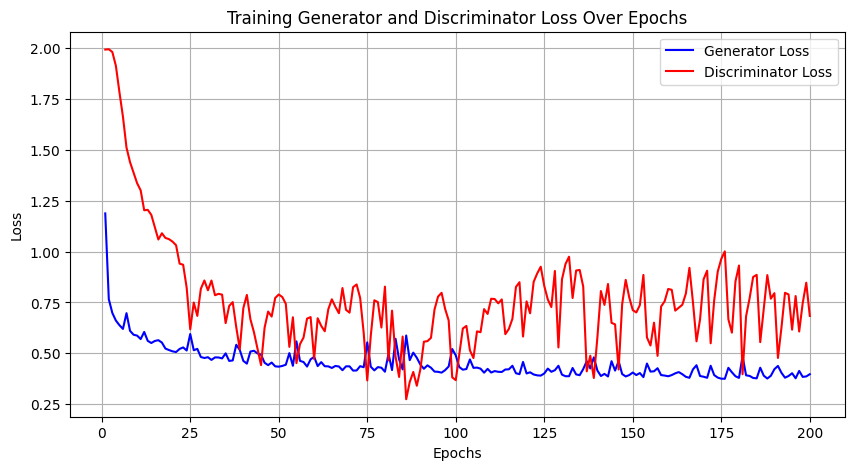

In [24]:
# Assuming gen_losses and disc_losses are lists containing loss values
epochs = range(1, len(train_losses_g) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses_g, label='Generator Loss', color='blue')
plt.plot(epochs, train_losses_d, label='Discriminator Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Generator and Discriminator Loss Over Epochs')
plt.legend()
plt.grid()
plt.show()

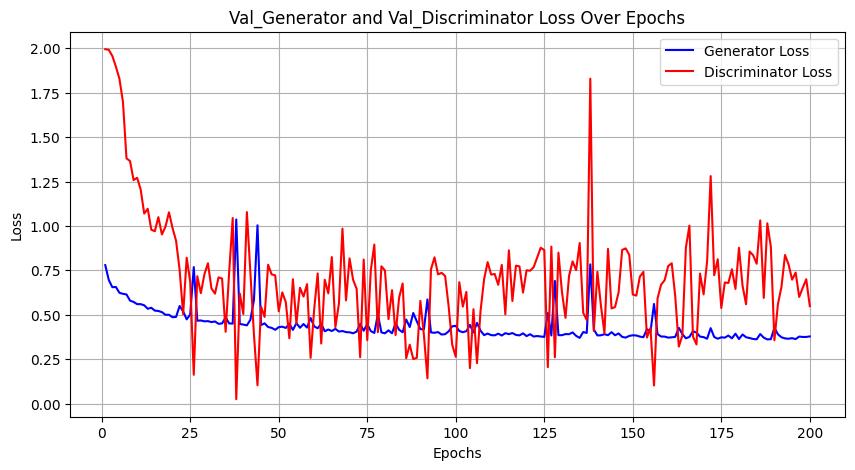

In [25]:
# Assuming gen_losses and disc_losses are lists containing loss values
epochs = range(1, len(val_losses_g) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, val_losses_g, label='Generator Loss', color='blue')
plt.plot(epochs, val_losses_d, label='Discriminator Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Val_Generator and Val_Discriminator Loss Over Epochs')
plt.legend()
plt.grid()
plt.show()

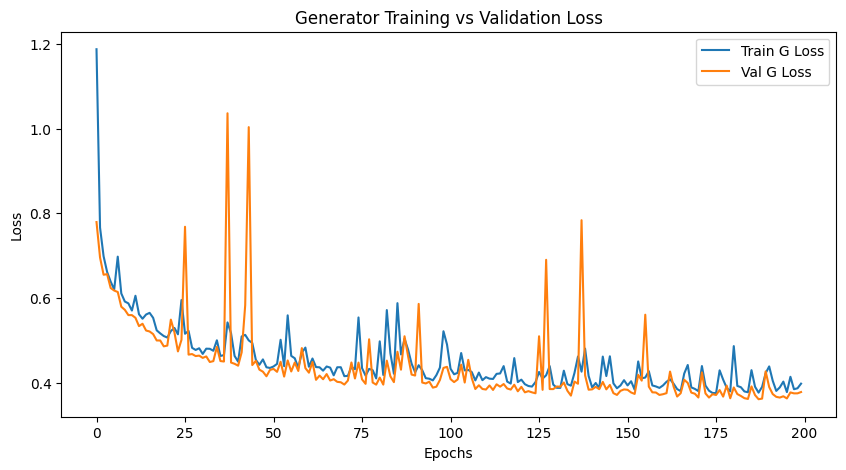

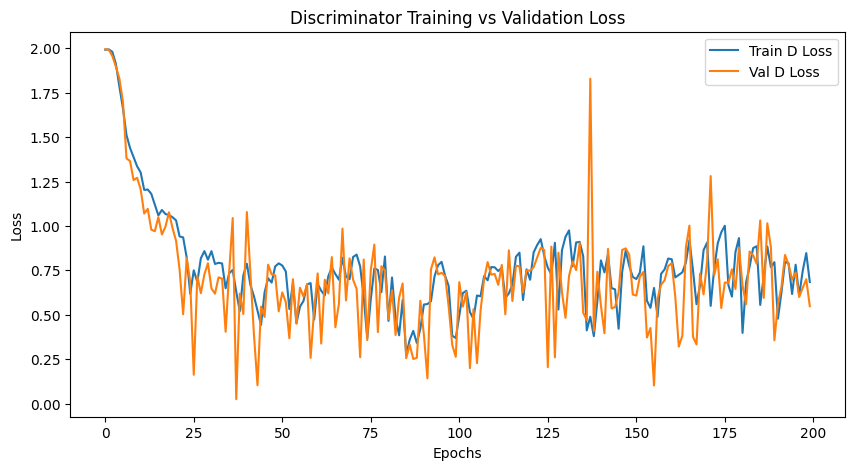

In [26]:

# Plot Generator Loss
plt.figure(figsize=(10,5))
plt.plot(train_losses_g, label="Train G Loss")
plt.plot(val_losses_g, label="Val G Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Generator Training vs Validation Loss")
plt.legend()
plt.show()

# Plot Discriminator Loss
plt.figure(figsize=(10,5))
plt.plot(train_losses_d, label="Train D Loss")
plt.plot(val_losses_d, label="Val D Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Discriminator Training vs Validation Loss")
plt.legend()
plt.show()


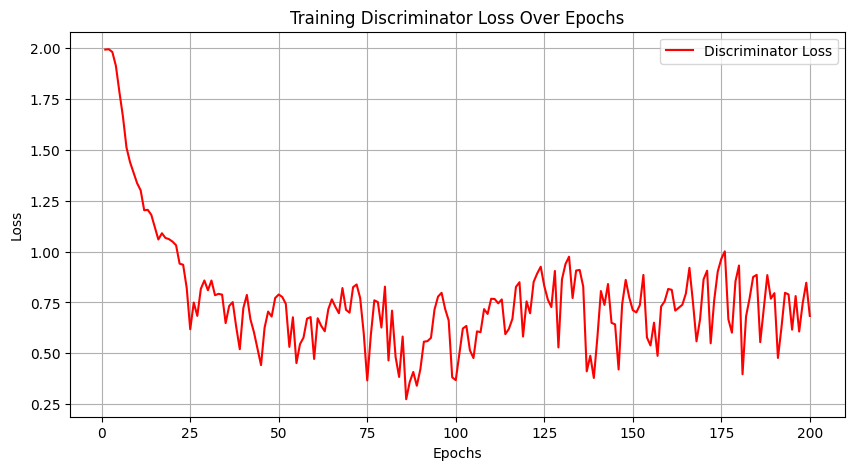

In [27]:
# Assuming gen_losses and disc_losses are lists containing loss values
epochs = range(1, len(train_losses_g) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses_d, label='Discriminator Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Discriminator Loss Over Epochs')
plt.legend()
plt.grid()
plt.show()

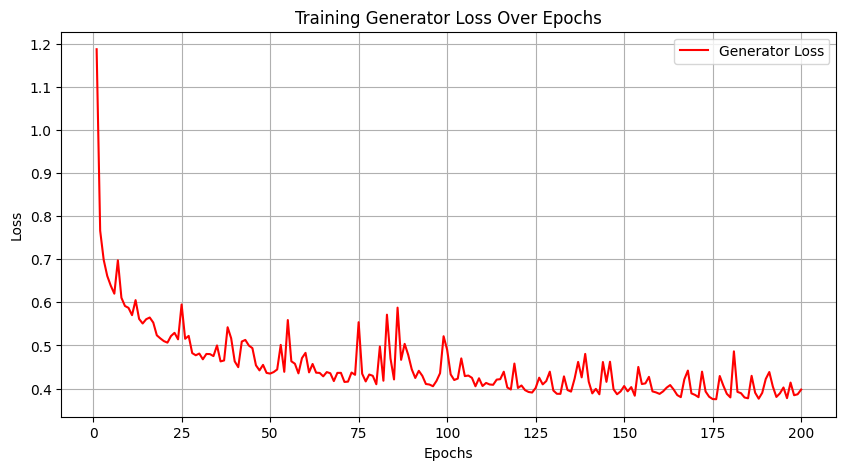

In [28]:

# Assuming gen_losses and disc_losses are lists containing loss values
epochs = range(1, len(train_losses_g) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses_g, label='Generator Loss', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Generator Loss Over Epochs')
plt.legend()
plt.grid()
plt.show()

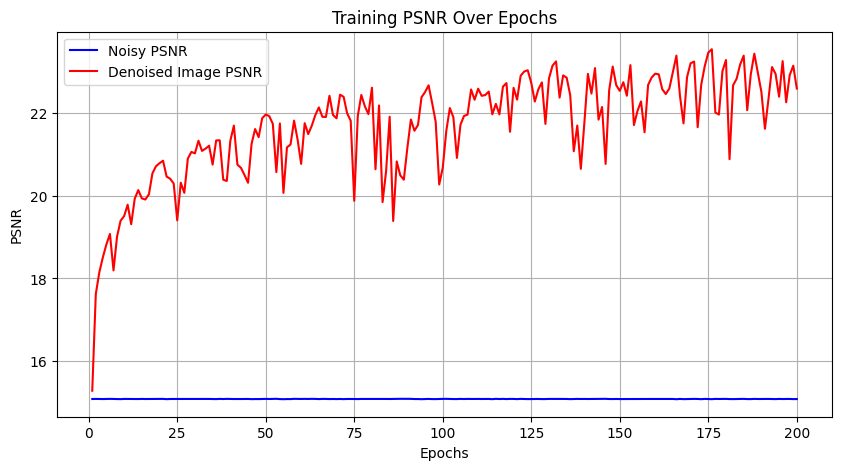

In [29]:
# Assuming gen_losses and disc_losses are lists containing loss values
epochs = range(1, len(noisy_psnr) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, noisy_psnr, label='Noisy PSNR', color='blue')
plt.plot(epochs, denoised_psnr, label='Denoised Image PSNR', color='red')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.title('Training PSNR Over Epochs')
plt.legend()
plt.grid()
plt.show()

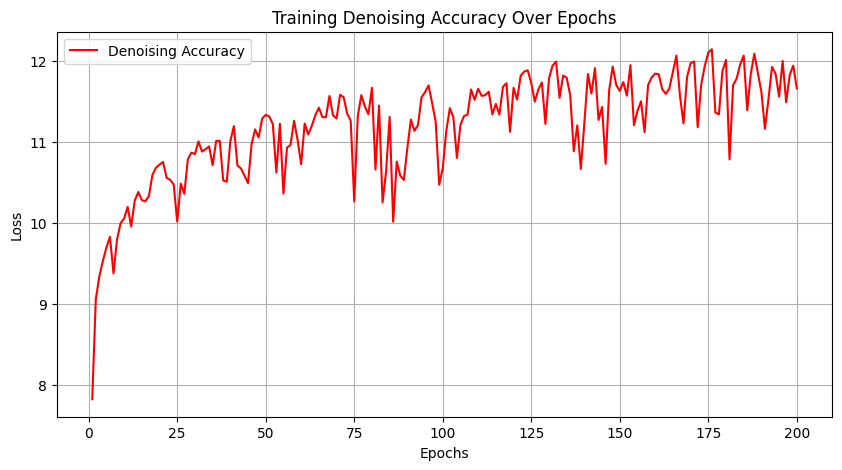

In [30]:
# Assuming gen_losses and disc_losses are lists containing loss values
epochs = range(1, len(denoising_accuracy_score) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, denoising_accuracy_score, label='Denoising Accuracy', color='red')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Denoising Accuracy Over Epochs')
plt.legend()
plt.grid()
plt.show()



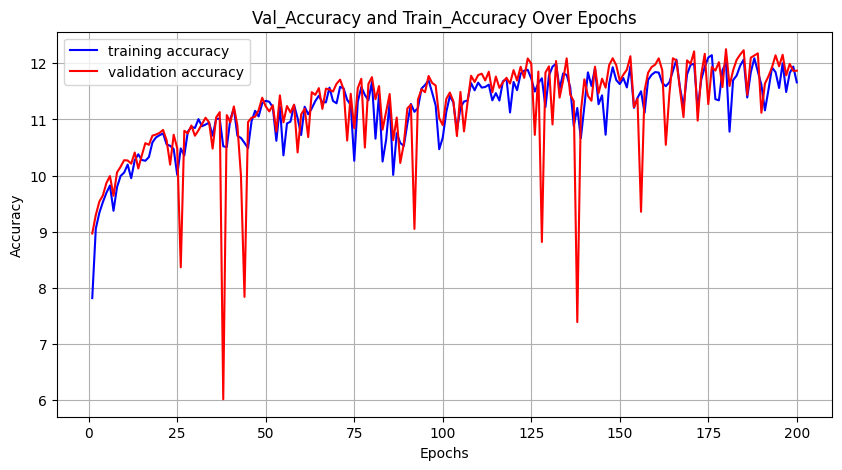

In [31]:
# Assuming gen_losses and disc_losses are lists containing loss values
epochs = range(1, len(denoising_accuracy_score) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, denoising_accuracy_score, label='training accuracy', color='blue')
plt.plot(epochs, val_denoising_accuracy_score, label='validation accuracy', color='red')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Val_Accuracy and Train_Accuracy Over Epochs')
plt.legend()
plt.grid()
plt.show()

In [32]:
# Printing the values
print("Train Losses (Generator):", train_losses_g)
print("Validation Losses (Generator):", val_losses_g)
print("Train Losses (Discriminator):", train_losses_d)
print("Validation Losses (Discriminator):", val_losses_d)
print("Noisy PSNR:", noisy_psnr)
print("Denoised PSNR:", denoised_psnr)
print("Denoising Accuracy Score:", denoising_accuracy_score)
print("Validation Denoising Accuracy Score:", val_denoising_accuracy_score)

Train Losses (Generator): [np.float32(1.1873695), np.float32(0.76619726), np.float32(0.69853294), np.float32(0.66132283), np.float32(0.6386055), np.float32(0.6202031), np.float32(0.69759774), np.float32(0.6107305), np.float32(0.5916463), np.float32(0.5872983), np.float32(0.57031983), np.float32(0.6052457), np.float32(0.5616192), np.float32(0.5509745), np.float32(0.56094545), np.float32(0.5648801), np.float32(0.55307347), np.float32(0.5236058), np.float32(0.5163978), np.float32(0.5100964), np.float32(0.50658715), np.float32(0.5218543), np.float32(0.5293381), np.float32(0.51421064), np.float32(0.5951738), np.float32(0.51552635), np.float32(0.5222286), np.float32(0.4822794), np.float32(0.4772914), np.float32(0.48126063), np.float32(0.46793783), np.float32(0.48028374), np.float32(0.48001269), np.float32(0.47533414), np.float32(0.50009537), np.float32(0.46305925), np.float32(0.46523836), np.float32(0.5423167), np.float32(0.5167123), np.float32(0.46316817), np.float32(0.44966906), np.float32

I0000 00:00:1740914708.453055    4549 service.cc:148] XLA service 0x5569db873450 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1740914708.453803    4549 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2025-03-02 17:10:08.502881: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-03-02 17:10:09.123507: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version 12.5.82. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


I0000 00:00:1740914709.342056    4549 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.070785865..0.9999993].


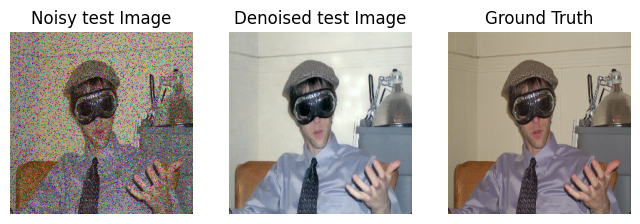

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048371732..1.0].


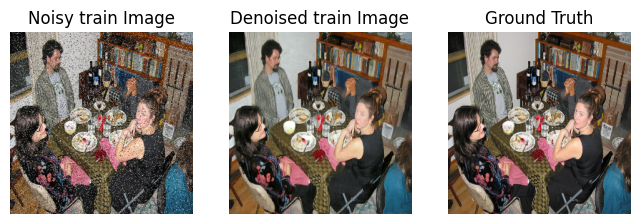

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08662491..1.0].


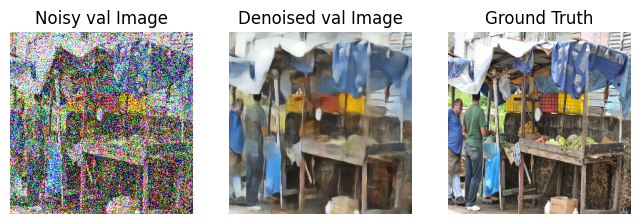

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0023171708..0.9999979].


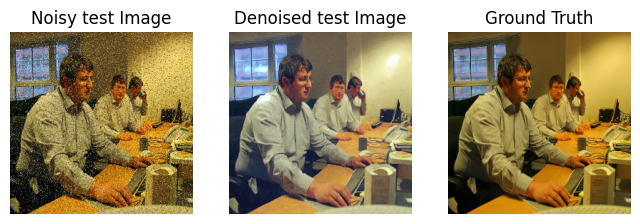

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16186036..1.0].


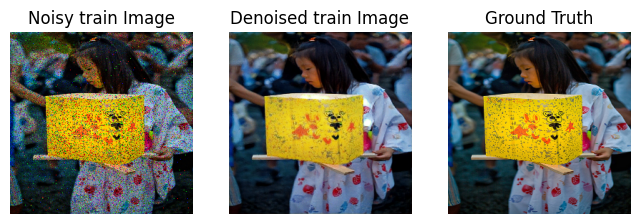

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


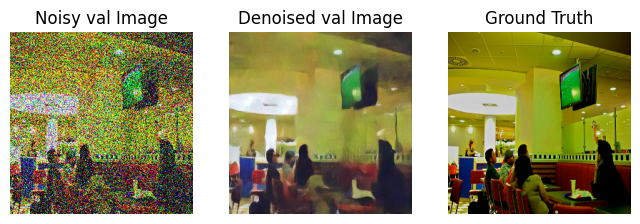

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11485886..0.999975].


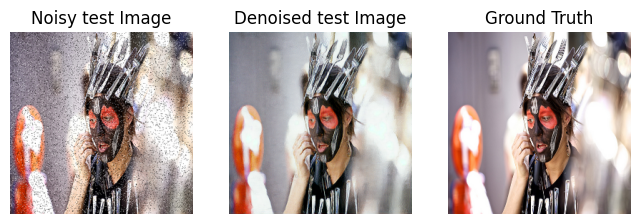

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1564185..0.9999989].


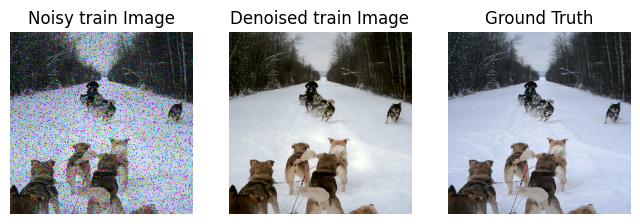

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08849102..0.99999976].


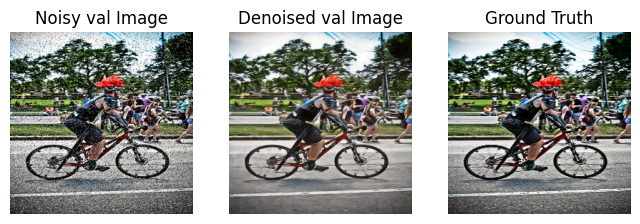

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


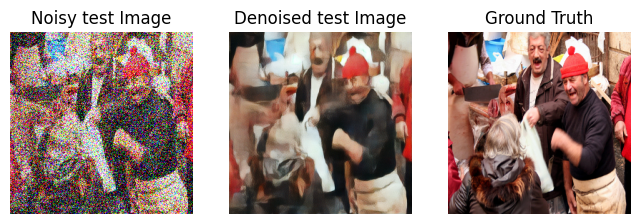

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11096761..1.0].


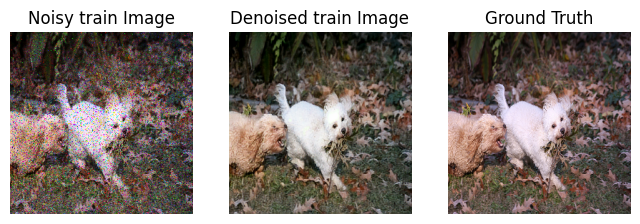

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


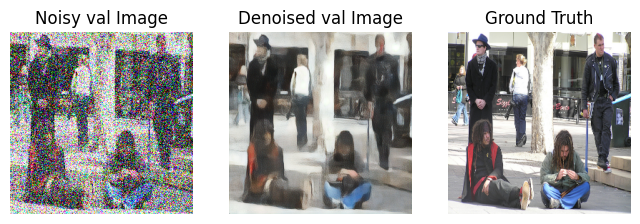

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13701838..1.0].


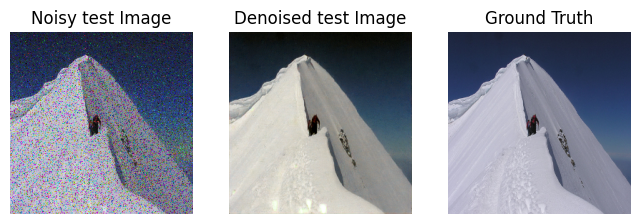

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12924194..1.0].


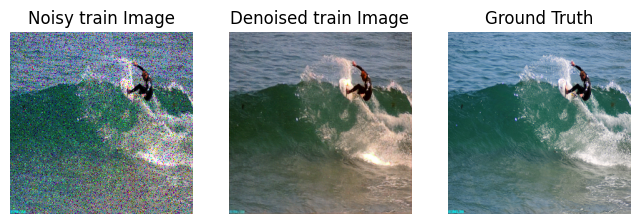

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.27647975..0.9999982].


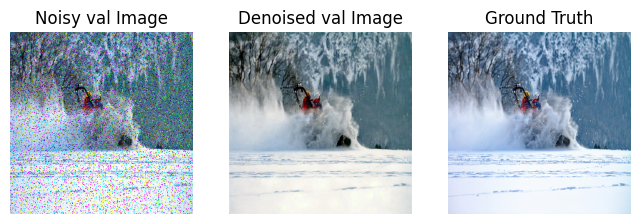

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11511508..1.0].


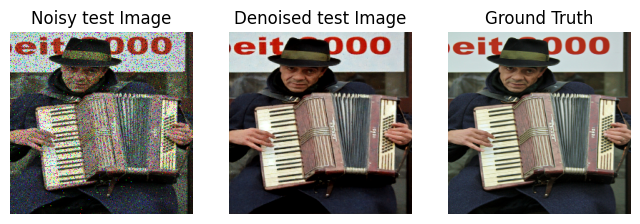

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


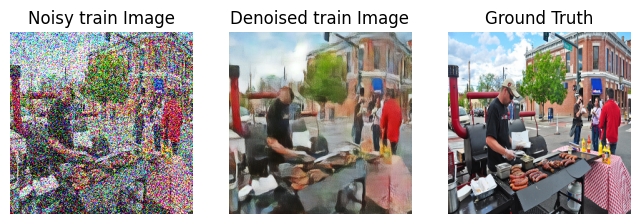

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009544352..1.0].


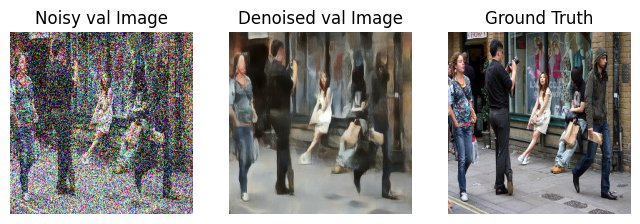

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.040710863..0.9999988].


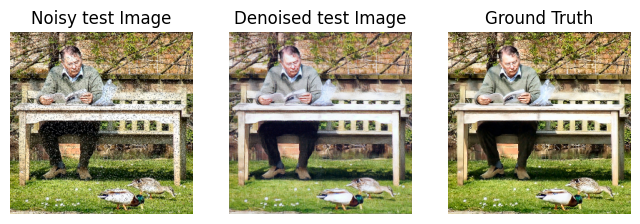

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055768825..0.99999326].


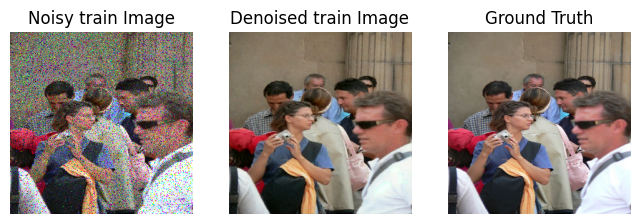

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09268057..1.0].


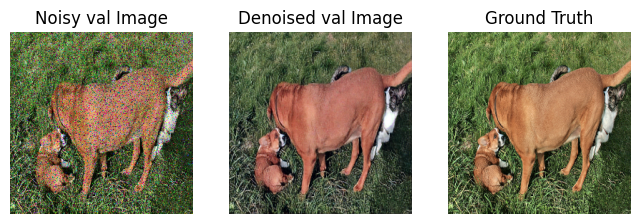

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08464568..1.0].


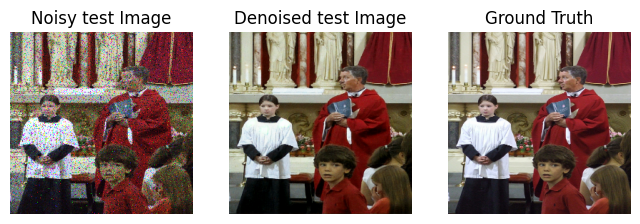

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22038971..0.99999803].


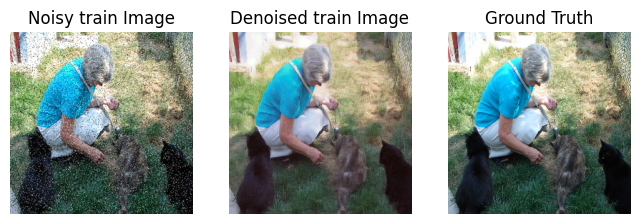

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12266..1.0].


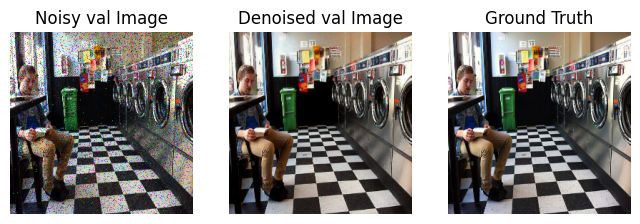

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035612192..1.0].


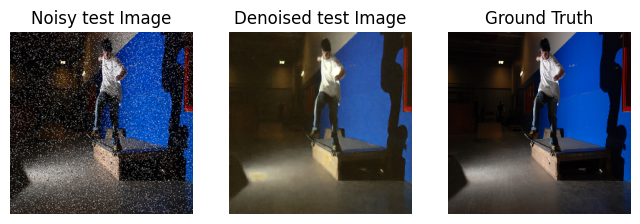

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0074343947..1.0].


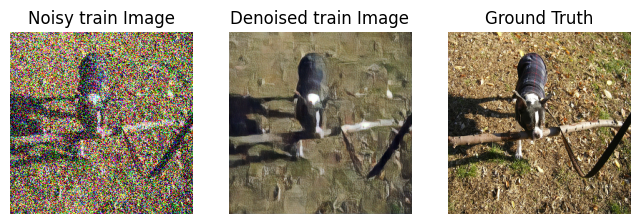

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045989003..1.0].


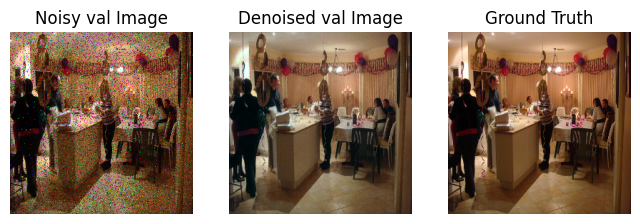

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.040264748..1.0].


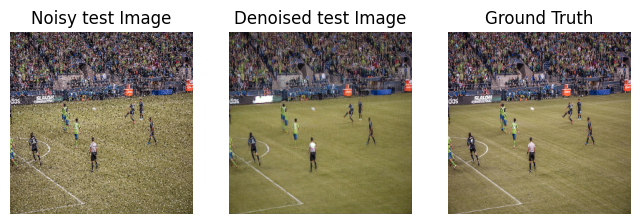

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060397334..1.0].


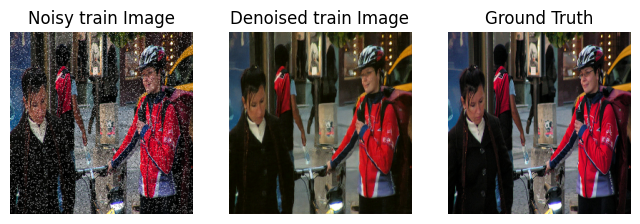

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1370329..1.0].


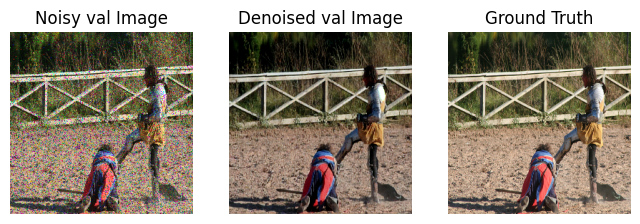

In [33]:
# Function to Generate and Display Denoised Test Images
def generate_and_display_test(noisy_image, ground_truth, image_type):
    """
    Uses the trained generator to denoise a test image and display the results.
    """
    noisy_image = np.expand_dims(noisy_image, axis=0)  # Add batch dimension
    denoised_image = generator.predict(noisy_image)[0]  # Get first (only) result

    # Display images
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(noisy_image[0])
    plt.title("Noisy "+ image_type + " Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(denoised_image)
    plt.title("Denoised "+ image_type + " Image")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(ground_truth)
    plt.title("Ground Truth")
    plt.axis("off")

    plt.show()

# Select test images by index and display results
test_indexes = [2, 8, 12, 25, 20, 100, 50, 80, 70, 60]
for idx in test_indexes:
    generate_and_display_test(X_test[idx], y_test[idx], "test")
    generate_and_display_test(X_train[idx], y_train[idx], "train")
    generate_and_display_test(X_val[idx], y_val[idx], "val")




# Test with a random noisy image from dataset
# random_idx = np.random.randint(len(X_train))


In [34]:
generator.save('/mnt/d/GAN based image denoiser- MAJOR PROJECT/working/resnet-vf-{epoch}-modified-accuracy.keras')
# generator.save("/mnt/d/GAN based image denoiser- MAJOR PROJECT/working/resnet-vf-{epoch}-modified-accuracy.keras")

In [35]:
# !pip install opencv-python

In [36]:
from tensorflow.keras.models import load_model
import cv2

# custom_objects = {
#     "InstanceNormalization": InstanceNormalization,
#     "SpectralNormalization": SpectralNormalization,
#     "residual_block": residual_block
# }

model = load_model("/mnt/d/GAN based image denoiser- MAJOR PROJECT/working/resnet-vf-{epoch}-modified-accuracy.keras")

 # Load and preprocess the noisy input image
img = cv2.imread("/mnt/d/GAN based image denoiser- MAJOR PROJECT/Mod_Final_data/Normalized_image/Gaussian/image-0001-clear.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img, (256, 256))

# Load model and predict denoised image
denoise_array = np.array([img_resized], dtype=float) / 255.0
denoised_output = model.predict(denoise_array)[0]  # Shape: (256, 256, 3)

# Scale back to image range [0, 255]
denoised_image = (denoised_output * 255).astype(np.uint8)

cv2.imwrite("/mnt/d/GAN based image denoiser- MAJOR PROJECT/working/image.jpg", cv2.cvtColor(denoised_image, cv2.COLOR_RGB2BGR))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


True

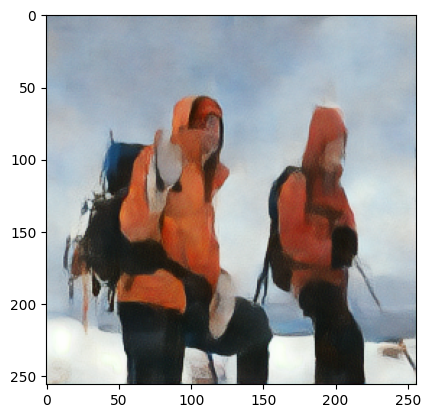

In [37]:

plt.imshow(denoised_output)

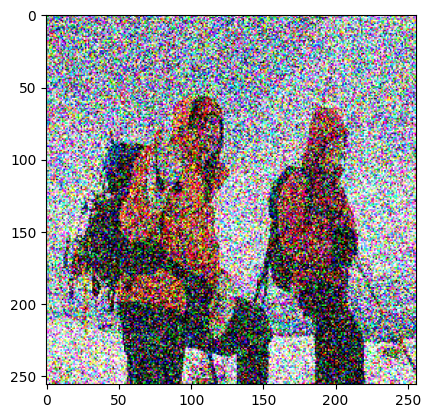

In [38]:
plt.imshow(img)

In [39]:
!pip show tensorflow

Name: tensorflow
Version: 2.18.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /home/doece/.local/lib/python3.10/site-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, requests, setuptools, six, tensorboard, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: 
